# Semantic Segmentation Models Benchmark

This notebook compares different configurations of the **SegFormer** model trained on the ForestSim dataset (24 semantic classes), with the goal of selecting the best configuration to use as the student/baseline network in the navigation pipeline.

For each model, the following are reported:
- **Training curves**: loss and metric trends on the train/validation sets;
- **Quantitative evaluation**: segmentation metrics (e.g. mIoU, per-class accuracy) and confusion matrix on the test set;
- **Qualitative evaluation**: visual examples of predictions on test images;
- **Performance benchmark**: model inference time and throughput.

The compared configurations vary in **architecture** (SegFormer B0 and B1) and in the **loss function** used during training (Dice + Cross-Entropy, Focal, Tversky).

In [ ]:
import pandas as pd
import torch

from dataset.dataloader import ForestDataLoader
from dataset.transforms import ForestTransforms

from models.segformer import SegFormer

from training.metrics import Metrics

from evaluation.training_plots import TrainingPlots
from evaluation.qualitative_evaluation import QualitativeEvaluation
from evaluation.quantitative_evaluation import QuantitativeEvaluation
from evaluation.benchmark import Benchmark
from evaluation.plots import Plots
from training.logger import Logger

In [2]:
device = torch.device("cuda" if torch.cuda.is_available() else "cpu")

device

device(type='cuda')

In [3]:
test_transform = ForestTransforms(augmentation=False, train=False).get_transforms()
dataloader = ForestDataLoader(test_transform=test_transform)
dataloader.create_dataloaders()

print("Train:", len(dataloader.train_dataset))
print("Validation:", len(dataloader.validation_dataset))
print("Test:", len(dataloader.test_dataset))

Train: 1695
Validation: 189
Test: 209


In [4]:
metrics = Metrics(num_classes=24)

## SegFormer B0 — Dice + Cross-Entropy

**SegFormer B0** model (lightest variant) trained with a combined **Dice + Cross-Entropy** loss, which merges Cross-Entropy's ability to guide pixel-wise classification with Dice loss's robustness to class imbalance.

In [ ]:
model = SegFormer().get_model()

In [6]:
logger = Logger()
logs = pd.read_csv(logger.log_file)
logs.head()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
0,1,1.409736,0.989706,0.00006,0.746568,0.142419,0.112021,0.136648,0.593175
1,2,0.936655,0.801938,0.00006,0.797475,0.175462,0.143845,0.171335,0.664188
2,3,0.806233,0.727595,0.00006,0.822700,0.196993,0.163187,0.192751,0.705484
3,4,0.744212,0.689775,0.00006,0.840148,0.211675,0.180380,0.211767,0.729609
4,5,0.708629,0.666850,0.00006,0.841072,0.218866,0.184150,0.217008,0.734086


In [7]:
logs.tail()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
145,146,0.359019,0.432078,0.000001,0.890916,0.346629,0.291887,0.345810,0.811095
146,147,0.362038,0.431119,0.000001,0.891377,0.346355,0.292037,0.345689,0.811857
147,148,0.356037,0.432527,0.000001,0.891016,0.346674,0.292113,0.345892,0.811343
148,149,0.358070,0.432051,0.000001,0.891129,0.345311,0.291799,0.345478,0.811407
149,150,0.357160,0.431838,0.000001,0.891243,0.347031,0.292147,0.345852,0.811615


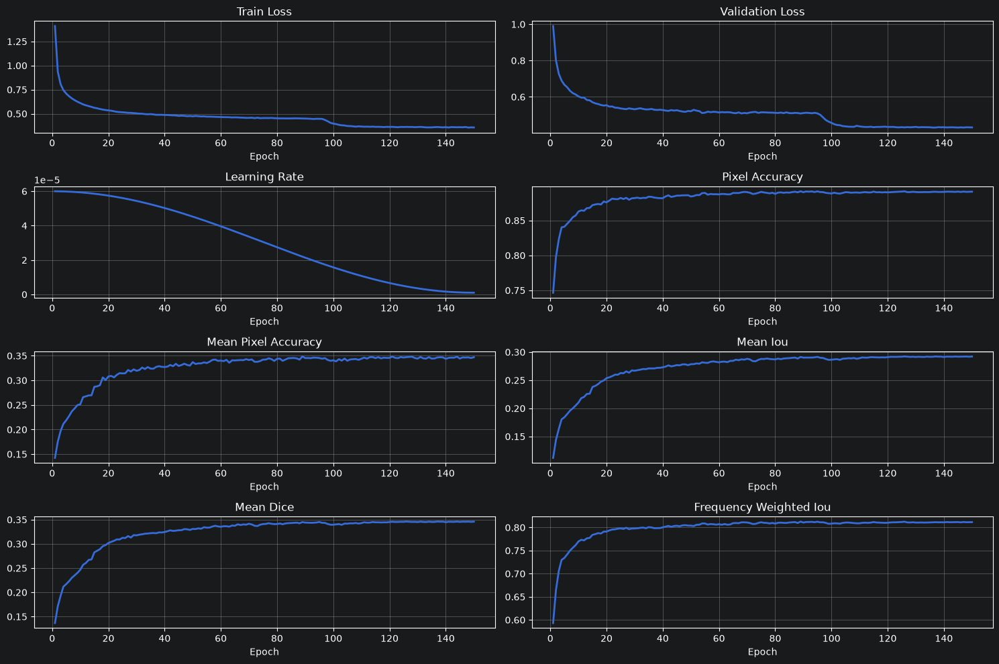

In [8]:
plots = TrainingPlots()

plots.plot_all()

In [9]:
evaluation = QuantitativeEvaluation(
    model=model,
    test_loader=dataloader.test_loader,
    metrics=metrics,
    device=device,
)

results = evaluation.evaluate()

evaluation.show_results()


TEST RESULTS:

Pixel Accuracy        : 0.8857
Mean Pixel Accuracy   : 0.3171
Mean IoU              : 0.2691
Mean Dice             : 0.3168
Frequency Weighted IoU: 0.8051


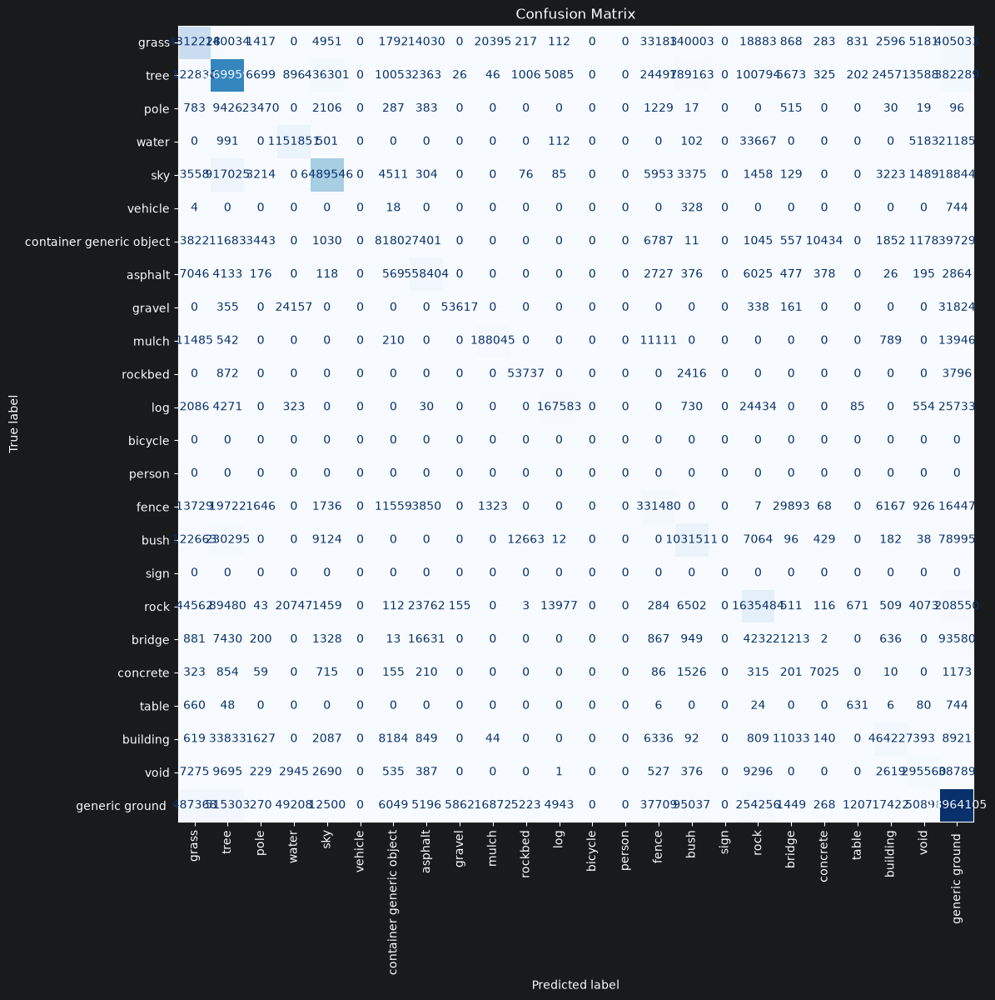

In [10]:
plots = Plots()

plots.confusion_matrix(results["confusion_matrix"])

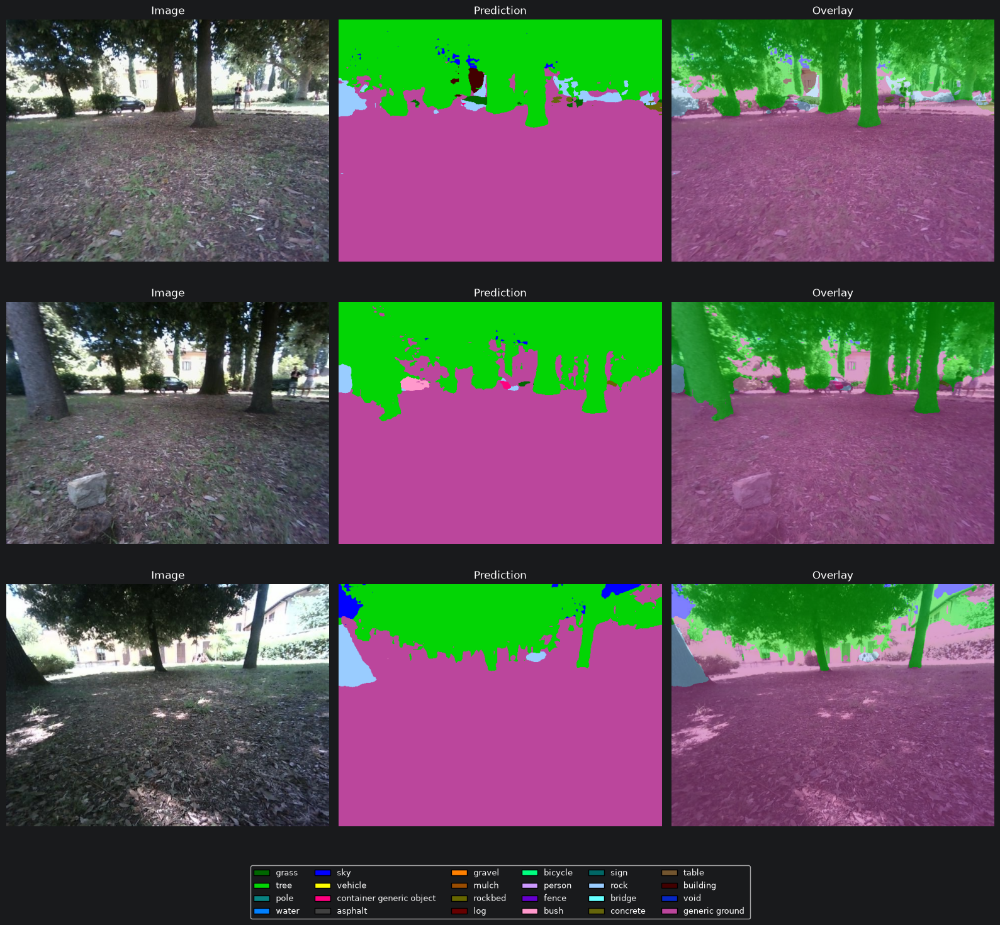

In [11]:
qualitative = QualitativeEvaluation(
    model=model,
    device=device,
    test_images_dir="/tmp/pycharm_project_044d01a8/evaluation/test_images"
)

qualitative.evaluate_multiple()

In [12]:
benchmark = Benchmark(
    model=model,
    dataloader=dataloader.test_loader,
    device=device,
)

results = benchmark.benchmark()

benchmark.show_results(results)


Benchmark Results:

Parameters           : 3,720,312
Trainable            : 3,720,312
Batch size           : 8
Latency              : 7.66 ms
FPS                  : 130.63
Throughput           : 1045.02 img/s
GPU Memory           : 0.00 MB
Peak GPU Memory      : 0.00 MB


## SegFormer B0 — Focal Loss

Same **SegFormer B0** architecture, this time trained with **Focal Loss**, designed to give more weight to hard-to-classify pixels/classes and mitigate the impact of majority classes on dataset imbalance.

In [ ]:
model = SegFormer().get_model()

In [6]:
logger = Logger()
logs = pd.read_csv(logger.log_file)
logs.head()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
0,1,1.401525,0.673826,0.00006,0.742024,0.136087,0.106832,0.127793,0.585877
1,2,0.598908,0.422788,0.00006,0.806323,0.181347,0.150808,0.180249,0.677137
2,3,0.441150,0.342809,0.00006,0.831848,0.211990,0.178034,0.209647,0.721837
3,4,0.367056,0.311242,0.00006,0.838908,0.217854,0.181950,0.213957,0.731310
4,5,0.327725,0.285867,0.00006,0.843838,0.220613,0.187230,0.219834,0.738306


In [7]:
logs.tail()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
145,146,0.090659,0.190845,0.000001,0.889985,0.327899,0.278808,0.330148,0.809060
146,147,0.090255,0.190197,0.000001,0.889882,0.325382,0.277851,0.328945,0.808704
147,148,0.090342,0.189949,0.000001,0.889886,0.324615,0.277740,0.328911,0.808576
148,149,0.090906,0.188047,0.000001,0.889974,0.327030,0.278306,0.329496,0.809327
149,150,0.089573,0.189043,0.000001,0.889852,0.326389,0.278174,0.329418,0.808897


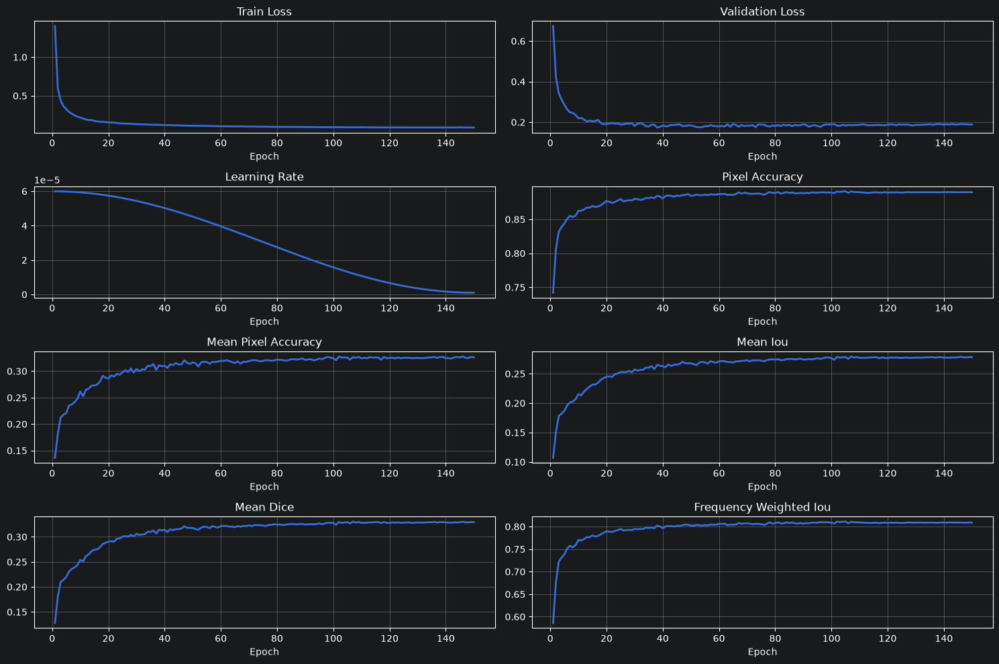

In [8]:
plots = TrainingPlots()

plots.plot_all()

In [9]:
evaluation = QuantitativeEvaluation(
    model=model,
    test_loader=dataloader.test_loader,
    metrics=metrics,
    device=device,
)

results = evaluation.evaluate()

evaluation.show_results()


TEST RESULTS:

Pixel Accuracy        : 0.8828
Mean Pixel Accuracy   : 0.3136
Mean IoU              : 0.2636
Mean Dice             : 0.3109
Frequency Weighted IoU: 0.8013


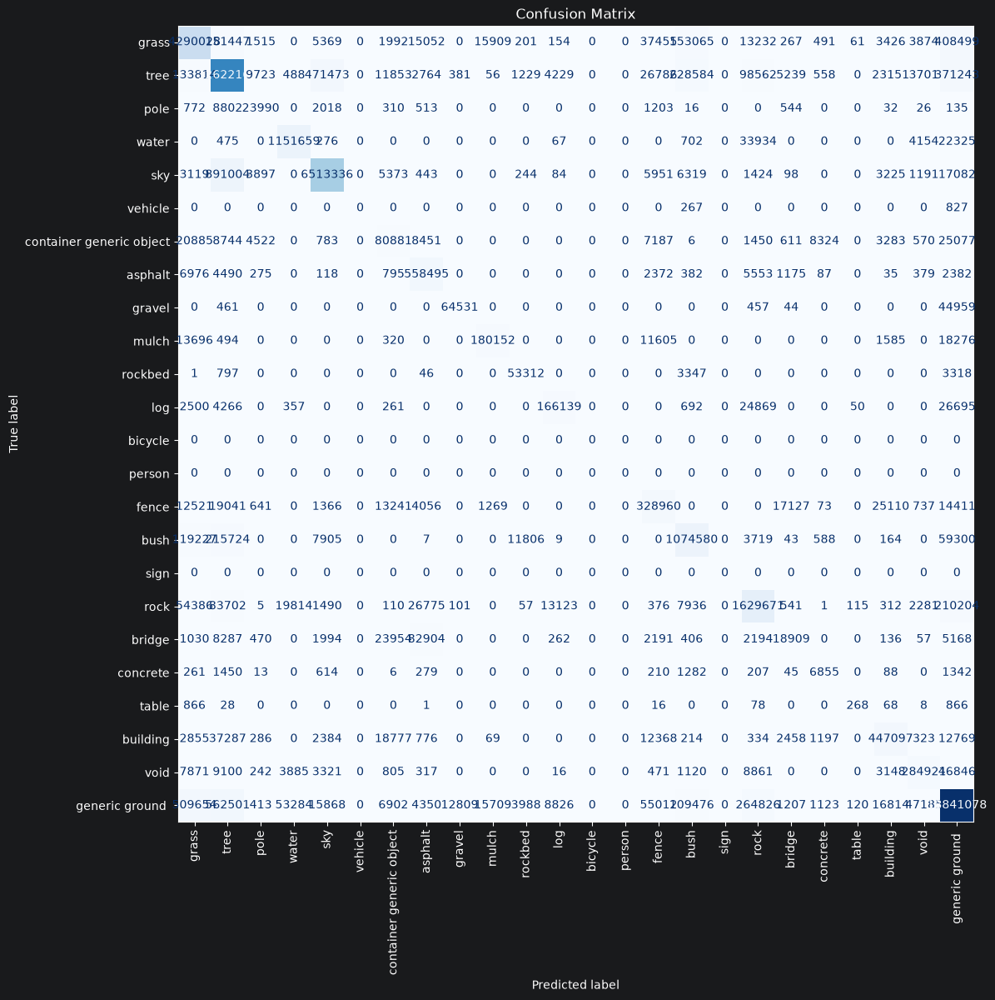

In [10]:
plots = Plots()

plots.confusion_matrix(results["confusion_matrix"])

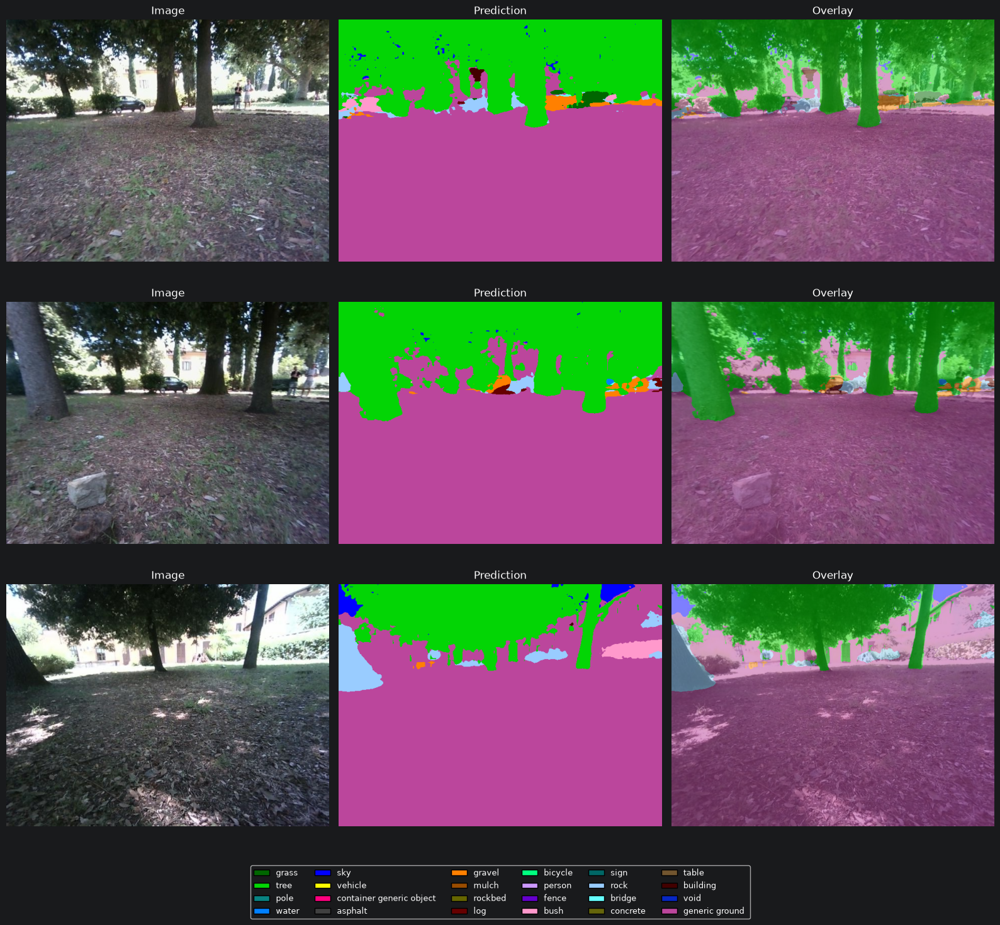

In [11]:
qualitative = QualitativeEvaluation(
    model=model,
    device=device,
    test_images_dir="/tmp/pycharm_project_044d01a8/evaluation/test_images"
)

qualitative.evaluate_multiple()

In [12]:
benchmark = Benchmark(
    model=model,
    dataloader=dataloader.test_loader,
    device=device,
)

results = benchmark.benchmark()

benchmark.show_results(results)


Benchmark Results:

Parameters           : 3,720,312
Trainable            : 3,720,312
Batch size           : 8
Latency              : 7.65 ms
FPS                  : 130.69
Throughput           : 1045.55 img/s
GPU Memory           : 0.00 MB
Peak GPU Memory      : 0.00 MB


## SegFormer B0 — Tversky Loss

**SegFormer B0** architecture trained with **Tversky Loss**, a generalization of Dice loss that allows differential weighting of false positives and false negatives, useful for better controlling the precision/recall trade-off on minority classes.

In [ ]:
model = SegFormer().get_model()

In [6]:
logger = Logger()
logs = pd.read_csv(logger.log_file)
logs.head()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
0,1,0.925463,0.869005,0.00006,0.751550,0.165951,0.128588,0.156713,0.606894
1,2,0.850689,0.830003,0.00006,0.786122,0.190983,0.148889,0.177916,0.658650
2,3,0.822939,0.817333,0.00006,0.801079,0.202264,0.159314,0.190318,0.681411
3,4,0.806703,0.792401,0.00006,0.822608,0.228151,0.182524,0.217686,0.710964
4,5,0.786755,0.781556,0.00006,0.825448,0.237293,0.188741,0.225541,0.719797


In [7]:
logs.tail()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
145,146,0.428016,0.474448,0.000001,0.878048,0.332547,0.279282,0.332186,0.792313
146,147,0.432060,0.474824,0.000001,0.877740,0.332148,0.279087,0.331996,0.792054
147,148,0.428055,0.476166,0.000001,0.877865,0.328829,0.277804,0.330506,0.792054
148,149,0.430273,0.474941,0.000001,0.877897,0.331412,0.278812,0.331674,0.792252
149,150,0.427070,0.474904,0.000001,0.877990,0.331813,0.278904,0.331735,0.792254


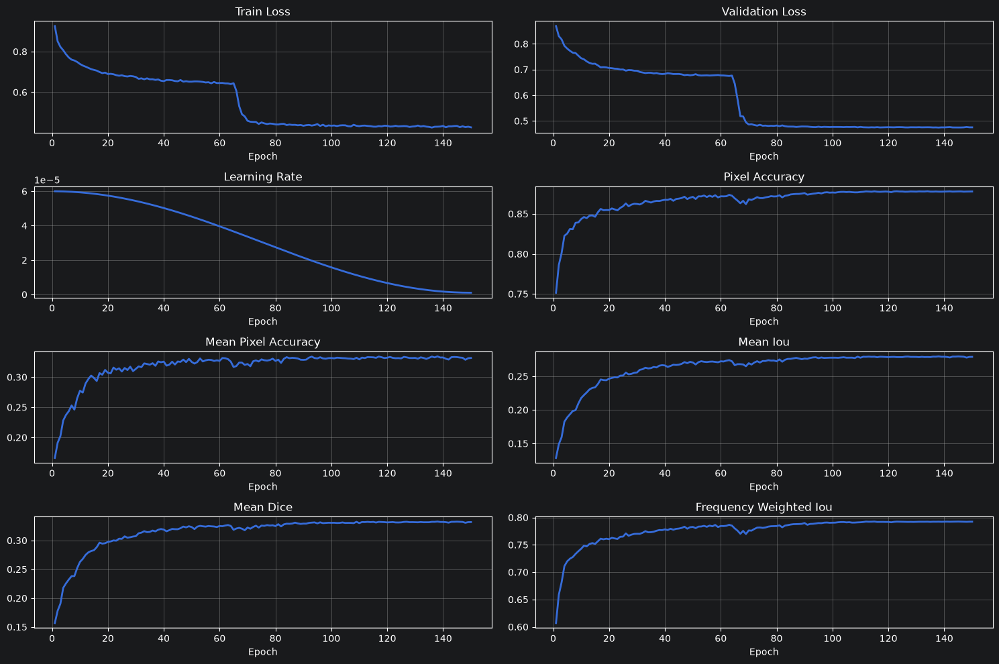

In [8]:
plots = TrainingPlots()

plots.plot_all()

In [9]:
evaluation = QuantitativeEvaluation(
    model=model,
    test_loader=dataloader.test_loader,
    metrics=metrics,
    device=device,
)

results = evaluation.evaluate()

evaluation.show_results()


TEST RESULTS:

Pixel Accuracy        : 0.8690
Mean Pixel Accuracy   : 0.3107
Mean IoU              : 0.2598
Mean Dice             : 0.3077
Frequency Weighted IoU: 0.7795


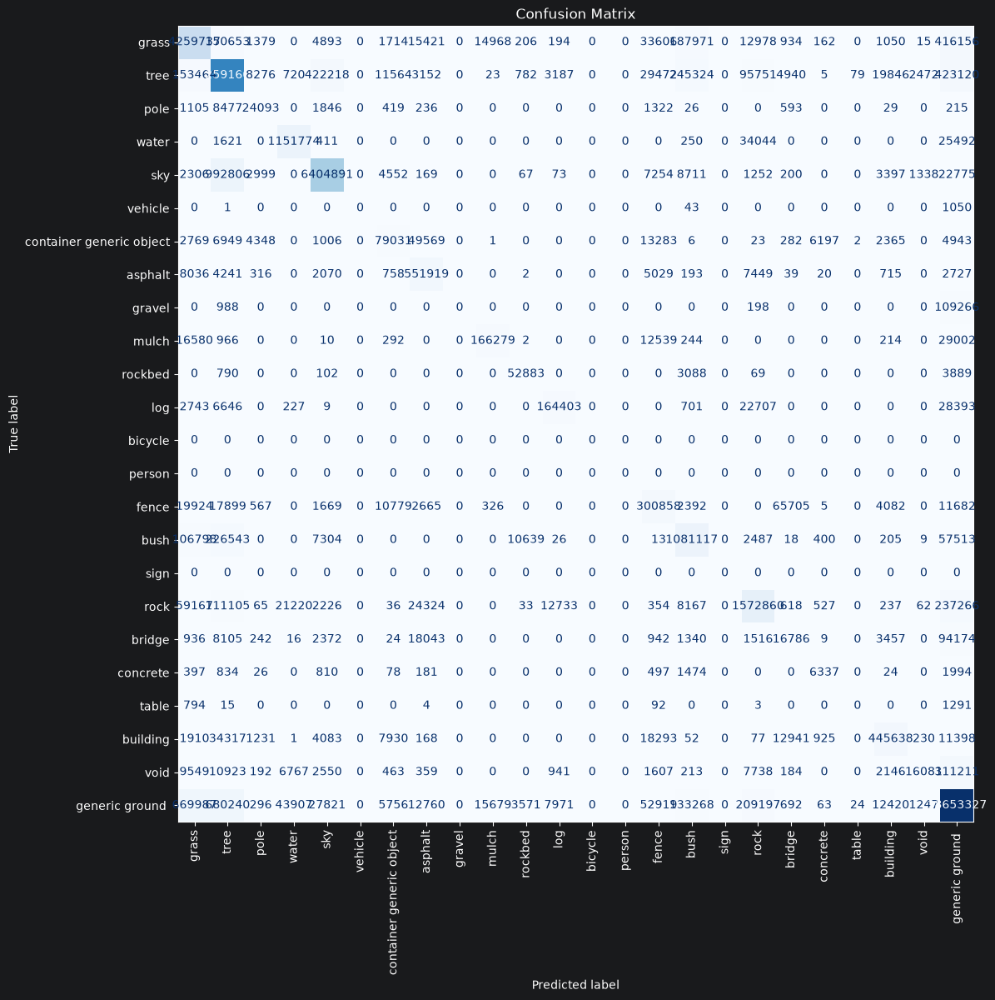

In [10]:
plots = Plots()

plots.confusion_matrix(results["confusion_matrix"])

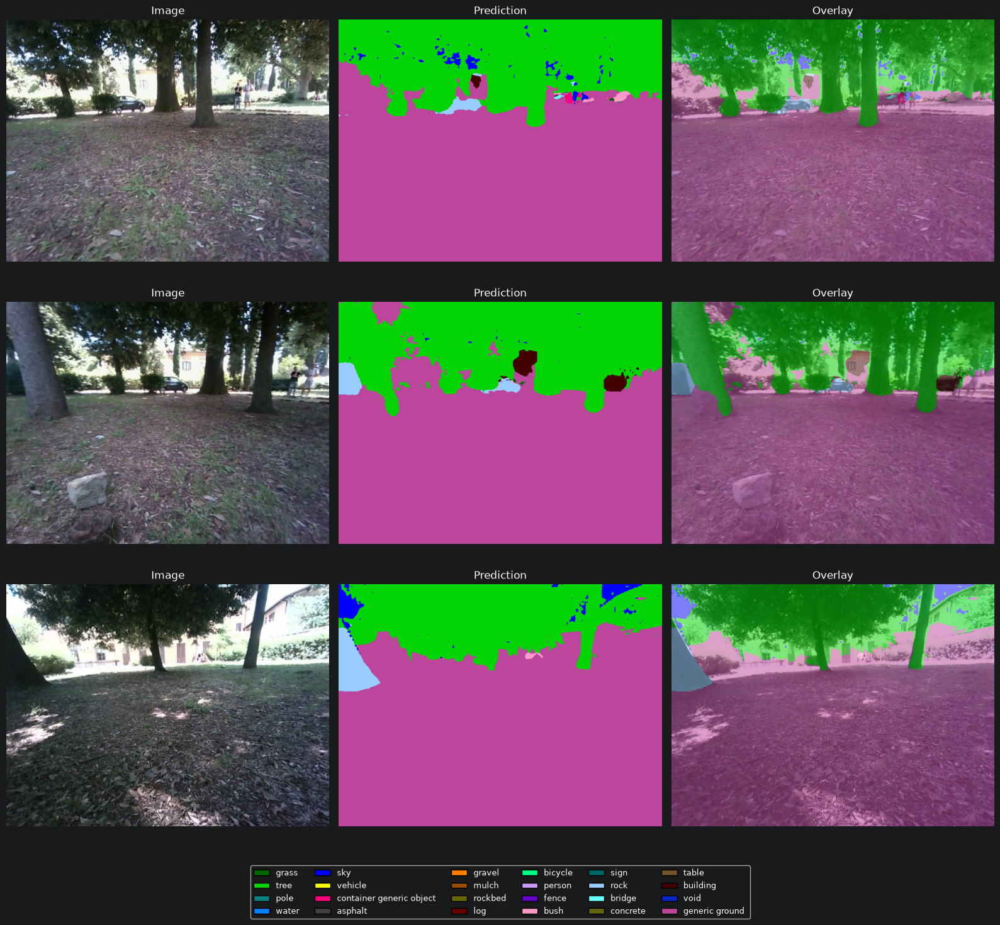

In [11]:
qualitative = QualitativeEvaluation(
    model=model,
    device=device,
    test_images_dir="/tmp/pycharm_project_044d01a8/evaluation/test_images"
)

qualitative.evaluate_multiple()

In [12]:
benchmark = Benchmark(
    model=model,
    dataloader=dataloader.test_loader,
    device=device,
)

results = benchmark.benchmark()

benchmark.show_results(results)


Benchmark Results:

Parameters           : 3,720,312
Trainable            : 3,720,312
Batch size           : 8
Latency              : 7.63 ms
FPS                  : 131.07
Throughput           : 1048.54 img/s
GPU Memory           : 0.00 MB
Peak GPU Memory      : 0.00 MB


## SegFormer B1 — Dice + Cross-Entropy

**SegFormer B1** model (higher capacity than B0) trained with the same combined **Dice + Cross-Entropy** loss, to evaluate the impact of greater model capacity given the same loss function.

In [ ]:
model = SegFormer().get_model()

In [7]:
logger = Logger()
logs = pd.read_csv(logger.log_file)
logs.head()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
0,1,1.314697,0.882327,0.00006,0.781814,0.164620,0.133273,0.159110,0.641243
1,2,0.850816,0.727793,0.00006,0.830793,0.206530,0.172466,0.202860,0.721473
2,3,0.743240,0.675724,0.00006,0.845118,0.215910,0.181998,0.212299,0.741850
3,4,0.689801,0.649352,0.00006,0.851123,0.227363,0.191944,0.224123,0.752542
4,5,0.654060,0.628933,0.00006,0.858006,0.233613,0.197683,0.230001,0.760288


In [8]:
logs.tail()

,epoch,train_loss,validation_loss,learning_rate,pixel_accuracy,mean_pixel_accuracy,mean_iou,mean_dice,frequency_weighted_iou
145,146,0.329510,0.399033,0.000001,0.903815,0.364813,0.313345,0.367355,0.830610
146,147,0.329203,0.399449,0.000001,0.903897,0.362287,0.312577,0.366428,0.830494
147,148,0.333665,0.399798,0.000001,0.903795,0.363294,0.312809,0.366752,0.830575
148,149,0.329335,0.398916,0.000001,0.903997,0.363713,0.312975,0.366776,0.830911
149,150,0.331809,0.399592,0.000001,0.903810,0.363276,0.312618,0.366400,0.830571


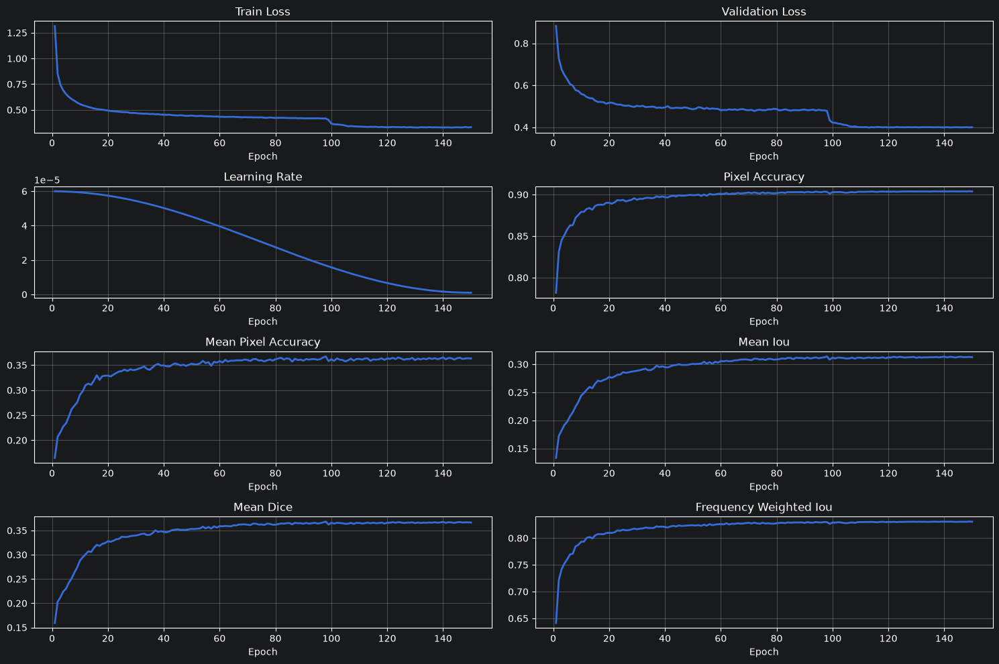

In [9]:
plots = TrainingPlots()

plots.plot_all()

In [10]:
evaluation = QuantitativeEvaluation(
    model=model,
    test_loader=dataloader.test_loader,
    metrics=metrics,
    device=device,
)

results = evaluation.evaluate()

evaluation.show_results()


TEST RESULTS:

Pixel Accuracy        : 0.8949
Mean Pixel Accuracy   : 0.3348
Mean IoU              : 0.2867
Mean Dice             : 0.3354
Frequency Weighted IoU: 0.8194


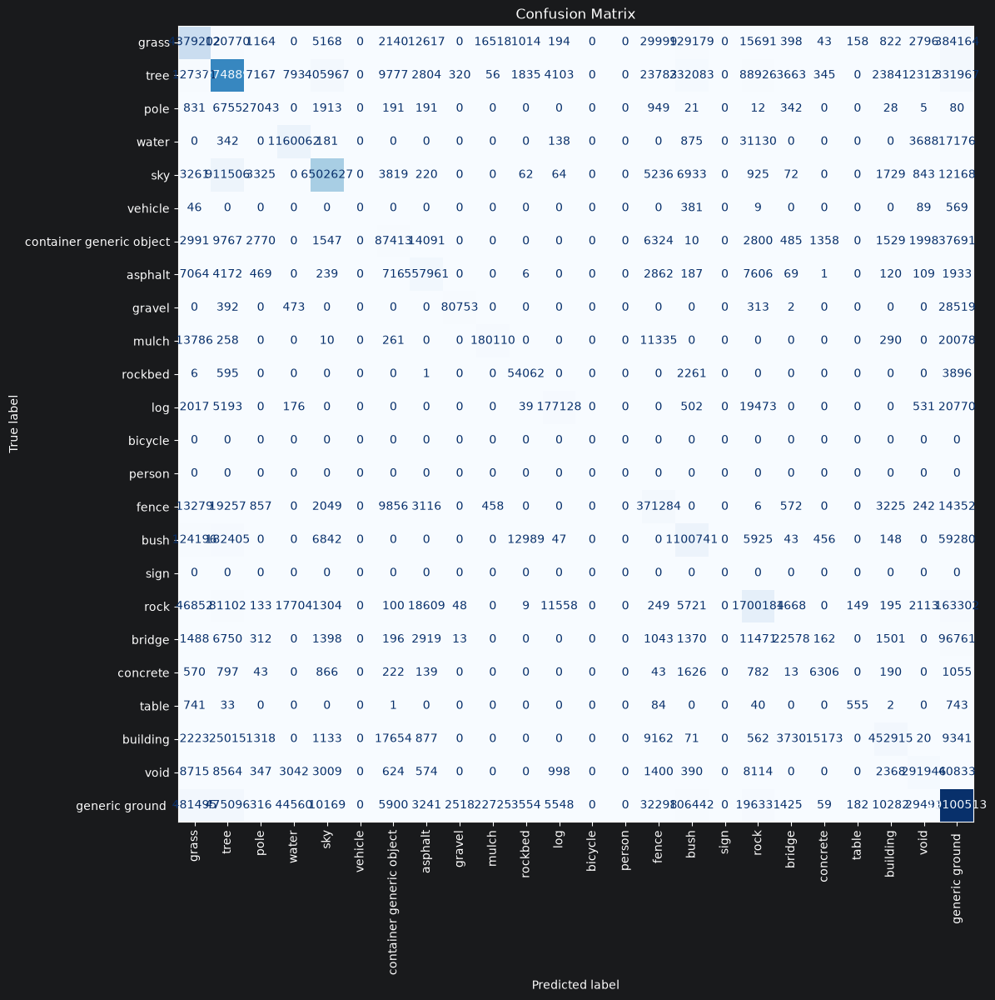

In [11]:
plots = Plots()

plots.confusion_matrix(results["confusion_matrix"])

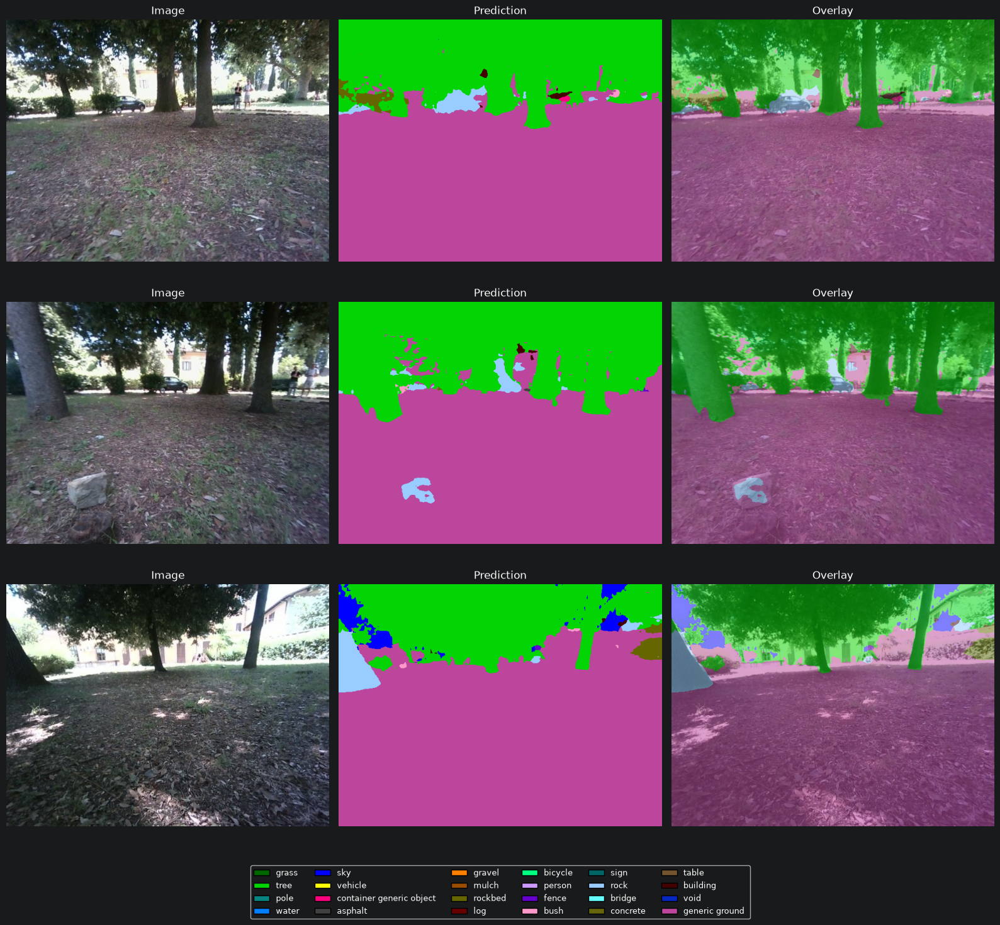

In [16]:
qualitative = QualitativeEvaluation(
    model=model,
    device=device,
    test_images_dir="/tmp/pycharm_project_044d01a8/evaluation/test_images"
)

qualitative.evaluate_multiple()

In [17]:
benchmark = Benchmark(
    model=model,
    dataloader=dataloader.test_loader,
    device=device,
)

results = benchmark.benchmark()

benchmark.show_results(results)


Benchmark Results:

Parameters           : 13,683,416
Trainable            : 13,683,416
Batch size           : 8
Latency              : 12.00 ms
FPS                  : 83.31
Throughput           : 666.47 img/s
GPU Memory           : 0.00 MB
Peak GPU Memory      : 0.00 MB
